In [1]:
import numpy as np
import matplotlib.pyplot as plt
from esn import ESN

In [2]:
# 時系列入力データ生成
T = 3000  # 長さ
u = np.random.rand(T, 1) - 0.5  # 区間[-0.5, 0.5]の乱数系列

# 時系列出力データ生成
delay = np.arange(41)  # 遅延長
d = np.empty((T, len(delay)))
for k in range(len(delay)):
    for t in range(T):
        d[t, k] = u[t - delay[k]]  # 遅延系列

# 学習用情報
T_trains = 1500  # 過渡期
train_U = u[0:T_trains].reshape(-1, 1)
train_D = d[0:T_trains, :].reshape(-1, len(delay))

# テスト用情報（学習データの後、さらに続くデータ）
test_U = u[T_trains:T].reshape(-1, 1)  # 学習データの後に続くデータ
test_D = d[T_trains:T, :].reshape(-1, len(delay))

In [3]:
# 入力層
N_u = 1
N_x = 150
input_scale = 1
rec_scale = 1.0
rho = 0.9
leaking_rate = 1
activation_func = np.tanh
seed = 0

# ESNのインスタンスを作成
esn = ESN(N_u, N_x, input_scale, rec_scale, rho, leaking_rate, activation_func, seed)

In [4]:
# リザバー状態の計算（学習データ）
stateCollectMat_train = esn.compute_reservoir_states(train_U)

# 学習（リードアウト重みの計算）
Wout = esn.train(stateCollectMat_train, train_D)

# テストデータでの予測
stateCollectMat_test = esn.compute_reservoir_states(test_U)
test_Y = esn.predict(Wout, stateCollectMat_test).T

Computing Reservoir States: 100%|█████████████████████████████| 1500/1500 [00:00<00:00, 7804.57it/s]


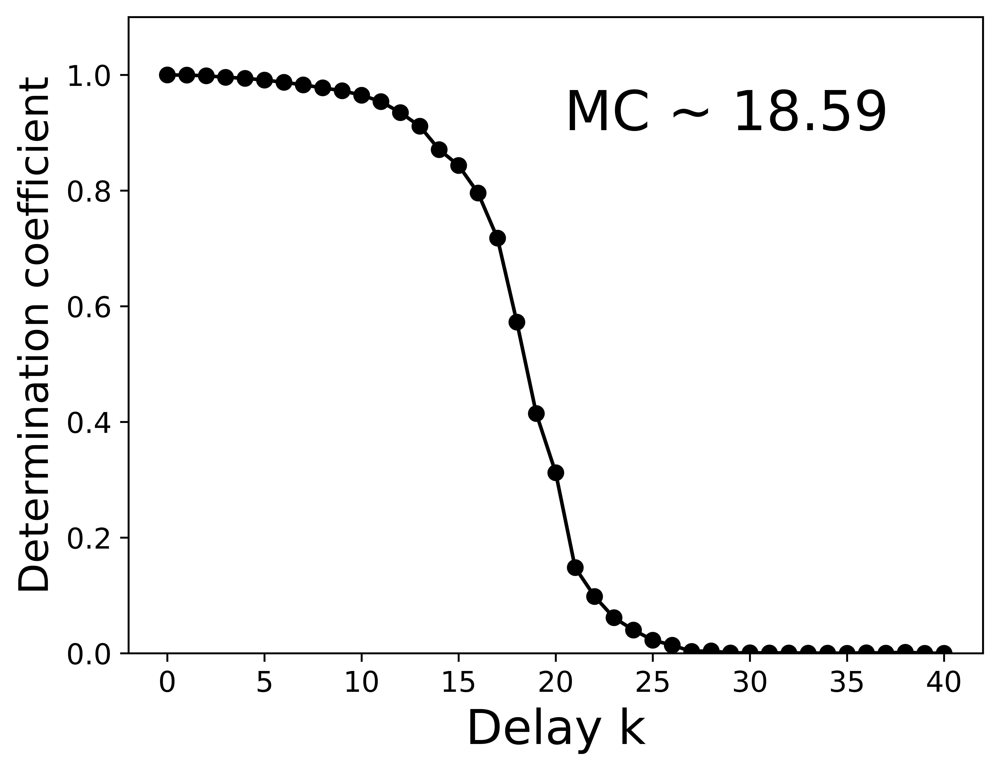

In [5]:
############################## 記憶容量のグラフ ##############################
# 忘却曲線の計算
DC = np.zeros((len(delay), 1))  # 決定係数
MC = 0.0  # 記憶容量
for k in range(len(delay)):
    corr = np.corrcoef(test_D[:, k], test_Y[:, k])  # 予測結果の対応する部分を使用
    DC[k] = corr[0, 1] ** 2  # 決定係数
    MC += DC[k]

# グラフ表示
plt.figure(dpi=1000)
plt.rcParams['font.size'] = 12
plt.plot(delay, DC, color='k', marker='o')
plt.ylim([0, 1.1])
plt.xticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
plt.title('MC ~ %3.2lf' % MC, x=0.7, y=0.8, fontsize=23)
plt.xlabel('Delay k', fontsize=20)
plt.ylabel('Determination coefficient', fontsize=17)

plt.show()

In [6]:
############################## 予測の可視化 ##############################
# サブプロット設定
fig, axs = plt.subplots(4, 1, figsize=(15, 15), dpi=1000)  # 4段に分けてサブプロットを作成

# 1段目：入力データのグラフ
axs[0].plot(np.arange(T_trains, T), test_U, color='k')
axs[0].set_ylabel('Input', fontsize=35)
axs[0].set_xlim(T_trains, T_trains + 200)  # 横軸の表示範囲を200点に設定
axs[0].tick_params(axis='both', labelsize=25)

# 2段目：delay5の予測値と目標値のグラフ
axs[1].plot(np.arange(T_trains, T), test_D[:, 5], label='Target')
axs[1].plot(np.arange(T_trains, T), test_Y[:, 5], linestyle='--', label='Prediction')
axs[1].set_ylabel('Output(k=5)', fontsize=35)
axs[1].set_xlim(T_trains, T_trains + 200)  # 横軸の表示範囲を200点に設定
axs[1].tick_params(axis='both', labelsize=25)
axs[1].legend(fontsize=23)

# 3段目：delay15の予測値と目標値のグラフ
axs[2].plot(np.arange(T_trains, T), test_D[:, 15], label='Target')
axs[2].plot(np.arange(T_trains, T), test_Y[:, 15], linestyle='--', label='Prediction')
axs[2].set_ylabel('Output(k=15)', fontsize=35)
axs[2].set_xlim(T_trains, T_trains + 200)  # 横軸の表示範囲を200点に設定
axs[2].tick_params(axis='both', labelsize=25)
axs[2].legend(fontsize=23)

# 4段目：delay25の予測値と目標値のグラフ
axs[3].plot(np.arange(T_trains, T), test_D[:, 25], label='Target')
axs[3].plot(np.arange(T_trains, T), test_Y[:, 25], linestyle='--', label='Prediction')
axs[3].set_xlabel('Time step', fontsize=35)
axs[3].set_ylabel('Output()k=25', fontsize=35)
axs[3].set_xlim(T_trains, T_trains + 200)  # 横軸の表示範囲を200点に設定
axs[3].tick_params(axis='both', labelsize=25)
axs[3].legend(fontsize=23)

# グラフの間隔を調整
plt.tight_layout()

# グラフ表示
plt.show()